# Сборный проект-4

# Поиск изображений по описанию

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

## Импорты

Импортируем необходимые библиотеки с которыми будем работать в проекте.

In [ ]:
import pandas as pd
import numpy as np
import nltk
import random
import matplotlib.pyplot as plt
import os

from requests import get as rGet
from zipfile import ZipFile
from io import BytesIO
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input,decode_predictions
from tensorflow.keras.optimizers import Adam
from tensorflow import cast,float64,stack,TensorShape,Variable,reduce_sum,linalg,add,constant,reshape,math,norm
from tensorflow.keras.losses import MeanSquaredError, MeanAbsoluteError
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GroupShuffleSplit
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Normalization, Dropout

Загрузка необходимых ресурсов для работы с естественным языком с помощью библиотеки ntlk.

In [ ]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

## Описание и загрузка данных

In [ ]:
url = 'https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip'

In [ ]:
path = 'data'
ZipFile(BytesIO(rGet(url).content)).extractall(path)

## 1. Исследовательский анализ данных

In [ ]:
dfTrain = pd.read_csv(path + '/to_upload/train_dataset.csv')

По заданию, нам известно, что в файле train_dataset.csv собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

Выведем на экран первые 5 значений датасета

In [ ]:
dfTrain.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


Ознакомимся со структурой и типом данных

In [ ]:
dfTrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [ ]:
dfTrain.describe()

,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3364151356_eecd07a23e.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34


In [ ]:
dfTest = pd.read_csv(path + '/to_upload/test_queries.csv', sep='|')[['image', 'query_id', 'query_text']]

В файле test_queries.csv находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

Загрузка датасетов со всеми колонками + добавление специальной колонки id, которая представляет собой комбинацию image и query_id, и соответственно id становится индексами датасета

Выведем на экран первые 5 значений датасета

In [ ]:
dfTest.head()

,image,query_id,query_text
0,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an..."
1,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .
2,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water
3,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...
4,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...


In [ ]:
dfTest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       500 non-null    object
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
dtypes: object(3)
memory usage: 11.8+ KB


In [ ]:
dfTest.describe()

,image,query_id,query_text
count,500,500,500
unique,100,500,500
top,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an..."
freq,5,1,1


In [ ]:
dfExp = pd.read_csv(path + '/to_upload/ExpertAnnotations.tsv', sep='\t', names=['image','query_id','exp1','exp2','exp3'])

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения. В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов.

Вывод первых 5 строк датасета экспертов

In [ ]:
dfExp.head()

,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


Информация о структуре данных:

In [ ]:
dfExp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp1      5822 non-null   int64 
 3   exp2      5822 non-null   int64 
 4   exp3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


Статистические показатели:

In [ ]:
dfExp.describe()

,exp1,exp2,exp3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Проверка наличия пропущенных значений:

In [ ]:
dfExp.isnull().sum()

image       0
query_id    0
exp1        0
exp2        0
exp3        0
dtype: int64

Визуализация распределения оценок:

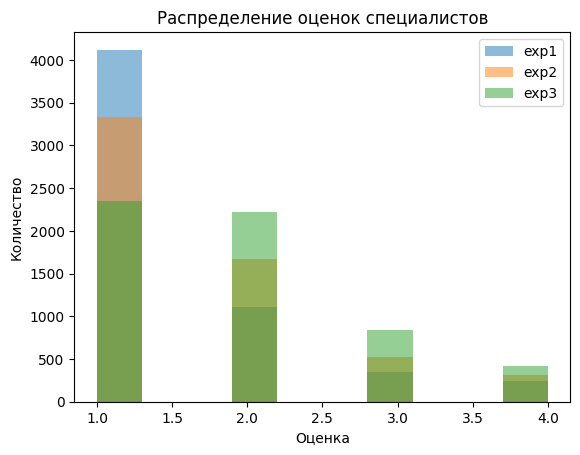

In [ ]:
dfExp[['exp1', 'exp2', 'exp3']].plot.hist(bins=10, alpha=0.5)
plt.xlabel('Оценка')
plt.ylabel('Количество')
plt.title('Распределение оценок специалистов')
plt.show()

Гистограмма помогает визуально оценить, какие значения оценок экспетов встречаются чаще (1) и реже (3, 4).

In [ ]:
dfPpl = pd.read_csv(path + '/to_upload/CrowdAnnotations.tsv', sep='\t', names=['image', 'query_id', 'ratioTrue', 'quantityTrue', 'quantityFalse'])

Из задания нам известно, что в файле с краудсорсинговыми оценками информация расположена в таком порядке:
Доля исполнителей, подтвердивших, что текст соответствует картинке.
Количество исполнителей, подтвердивших, что текст соответствует картинке.
Количество исполнителей, подтвердивших, что текст не соответствует картинке.

Вывод первых 5 строк датасета

In [ ]:
dfPpl.head()

,image,query_id,ratioTrue,quantityTrue,quantityFalse
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [ ]:
dfPpl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   ratioTrue      47830 non-null  float64
 3   quantityTrue   47830 non-null  int64  
 4   quantityFalse  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


Статистические метрики и распределение числовых переменных:

In [ ]:
dfPpl.describe()

,ratioTrue,quantityTrue,quantityFalse
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


График распределения значений переменной ratioTrue:

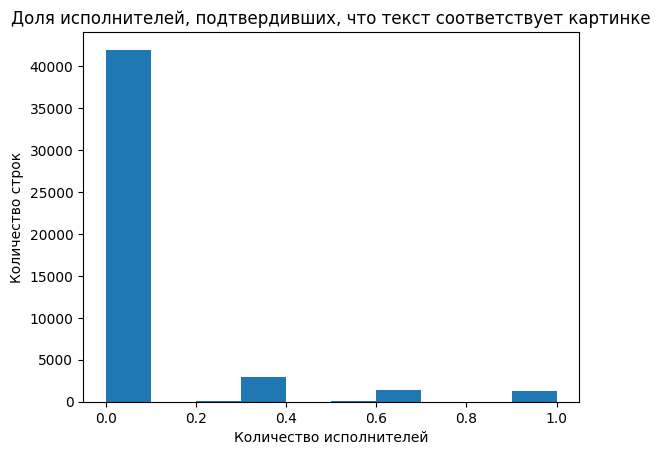

In [ ]:
plt.hist(dfPpl['ratioTrue'], bins=10)
plt.xlabel('Количество исполнителей')
plt.ylabel('Количество строк')
plt.title('Доля исполнителей, подтвердивших, что текст соответствует картинке')
plt.show()

Вывод:
 - Гистограмма помогает визуально оценить, что большая доля исполнителей, указала, что текст не соответствует картинке (значение 0), более 40 000 значений.

Количество исполнителей, подтвердивших, что текст соответствует картинке

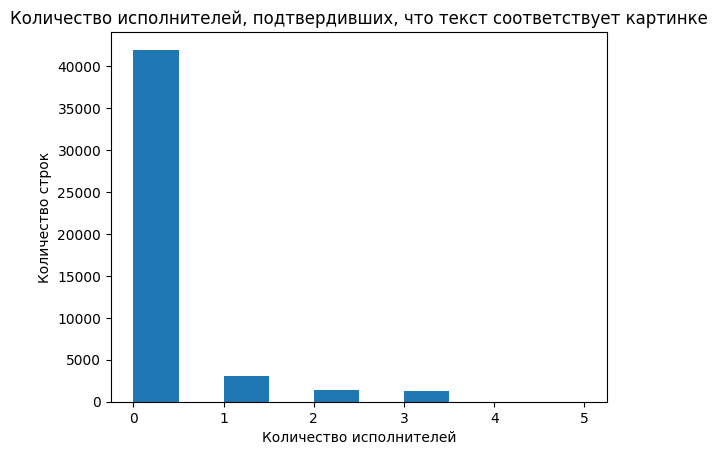

In [ ]:
plt.hist(dfPpl['quantityTrue'], bins=10)
plt.xlabel('Количество исполнителей')
plt.ylabel('Количество строк')
plt.title('Количество исполнителей, подтвердивших, что текст соответствует картинке')
plt.show()

Вывод:
 - Гистограмма показывает более 40 000 записей со значением 0, исполнители в большинстве своем не подтверждают, что текст соответствует картинке.

Количество исполнителей, подтвердивших, что текст не соответствует картинке

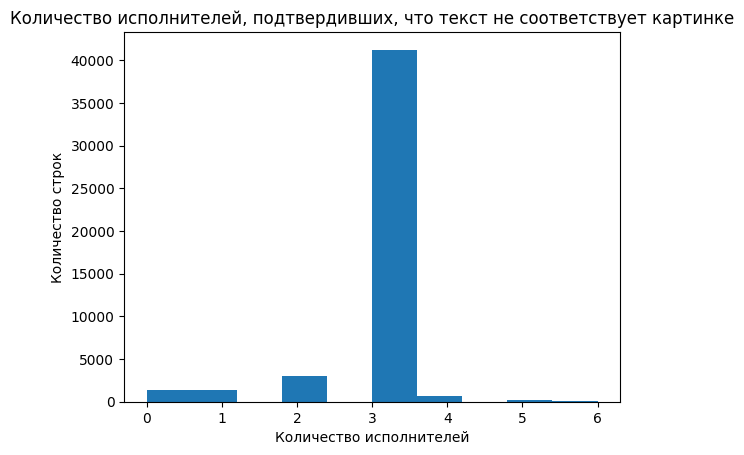

In [ ]:
plt.hist(dfPpl['quantityFalse'], bins=10)
plt.xlabel('Количество исполнителей')
plt.ylabel('Количество строк')
plt.title('Количество исполнителей, подтвердивших, что текст не соответствует картинке')
plt.show()

Вывод:
 - Датасет содержит более 40 000 записей, где 3 исполнителя подтвердили, что текст не соответствует картинке.

### Общий вывод: Провели EDA
 - в **train_dataset.csv** собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания
    - столбец `image` содержит 5822 записи (тип `object`)
    - столбец `query_id` содержит 5822 записи (тип `object`)
    - столбец `query_text` содержит 5822 записи (тип `object`)
  - Уникальных значений в столбце `image` - `1000`
  - Уникальных значений в столбце `query_id` - `977`    


 - в **test_queries.csv** собрана информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение
    - столбец `image` содержит 500  записи (тип `object`)
    - столбец `query_id` содержит 500 записи (тип `object`)
    - столбец `query_text` содержит записи (тип `object`)
  - Уникальных значений в столбце `image` - `100`
  - Уникальных значений в столбце `query_id` - `500`

 - в **ExpertAnnotations.tsv** содержатся экспертные оценки соответствия текста и изображения
    - столбец `image` содержит 5822 записи (тип `object`)
    - столбец `query_id` содержит 5822 записи (тип `object`)
    - столбец `exp1` содержит 5822 записи (тип `int64`)
    - столбец `exp2` содержит 5822  записи (тип `int64`)
    - столбец `exp3` содержит 5822  записи (тип `int64`)
        - min значения всех экспертов -	`1.000000`
        - max	значения всех экспертов - `4.000000`
        - std значение `exp1` -	`0.787084`, `exp2` - `0.856222`, `exp3` -	`0.904087`  

  - Построили гистограмму, которая помогла визуально оценить, какие значения оценок экспетов встречаются чаще (1) и реже (3, 4).  



 - датасет **CrowdAnnotations.tsv** с краудсорсинговыми оценками
  - столбец `image` содержит 47830  записи (тип `object`)
  - столбец `query_id` содержит 47830 записи (тип `object`)
  - столбец `ratioTrue` содержит 47830 записи (тип `float64`)
  - столбец `quantityTrue` содержит 47830 записи (тип `int64`)
  - столбец `quantityFalse` содержит 47830 записи (тип `int64 `)

  - min	значения числовых столбцов - `0.000000`
  - max	значения столбца `ratioTrue` - `1.000000`, `quantityTrue` -	`5.000000`, `quantityFalse` -	`6.000000`

  - Доля исполнителей, подтвердивших, что текст соответствует картинке. Гистограмма помогает визуально оценить, что большая доля исполнителей, указала, что текст не соответствует картинке (значение 0), более 40 000 значений.

  - Количество исполнителей, подтвердивших, что текст соответствует картинке. Гистограмма показывает более 40 000 записей со значением 0, исполнители в большинстве своем не подтверждают, что текст соответствует картинке.

  - Количество исполнителей, подтвердивших, что текст не соответствует картинке. Датасет содержит более 40 000 записей, где 3 исполнителя подтвердили, что текст не соответствует картинке

Выведем на экран рандомные 9 изображений из папки test_images.

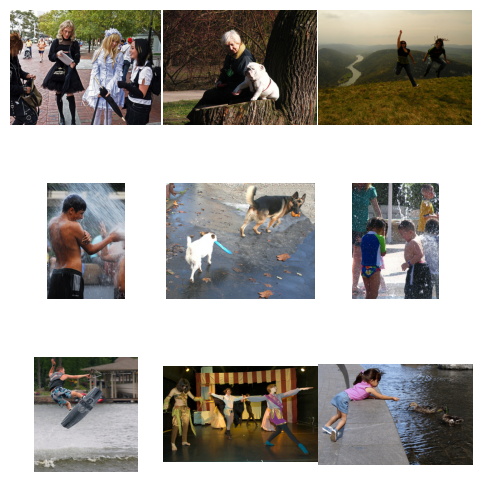

In [ ]:
test_images_explore = path + '/to_upload/test_images'
files = [f for f in os.listdir(test_images_explore) if not f.startswith('.') and os.path.isfile(os.path.join(test_images_explore, f))]
random_files = random.sample(files, 9)
fig, axs = plt.subplots(3, 3, figsize=(6, 6))
fig.subplots_adjust(hspace = .5, wspace=.001)
for i, ax in enumerate(axs.flat):
    img = plt.imread(os.path.join(test_images_explore, random_files[i]))
    ax.imshow(img)
    ax.axis('off')
plt.show()

Выведем на экран рандомные 9 изображений из папки train_images.

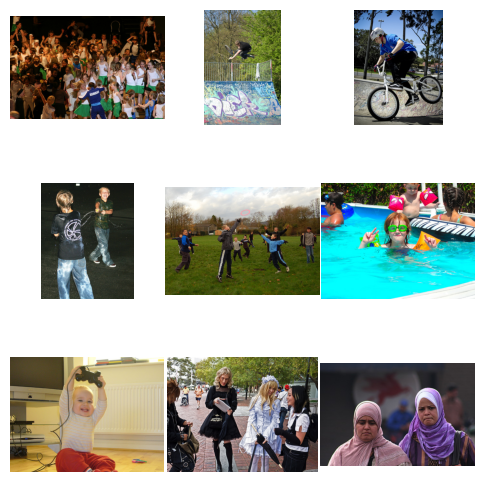

In [ ]:
train_images_explore = path + '/to_upload/train_images'
files = [f for f in os.listdir(test_images_explore) if not f.startswith('.') and os.path.isfile(os.path.join(test_images_explore, f))]
random_files = random.sample(files, 9)
fig, axs = plt.subplots(3, 3, figsize=(6, 6))
fig.subplots_adjust(hspace = .5, wspace=.001)
for i, ax in enumerate(axs.flat):
    img = plt.imread(os.path.join(test_images_explore, random_files[i]))
    ax.imshow(img)
    ax.axis('off')
plt.show()

## 2. Проверка данных

По заданию наша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1. Для этого обработаем датасеты с экспертными  и краудсорсинговыми оценками.

Создадим новый столбец в экспертном датасете

In [ ]:
dfExp.insert(1,'id',dfExp[['image','query_id']].apply(''.join,axis=1))
dfExp = dfExp.set_axis(dfExp['id'].tolist(),axis=0)

In [ ]:
dfExp.head()

,image,id,query_id,exp1,exp2,exp3
1056338697_4f7d7ce270.jpg2549968784_39bfbe44f9.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg2549968784_39bfbe44f9...,2549968784_39bfbe44f9.jpg#2,1,1,1
1056338697_4f7d7ce270.jpg2718495608_d8533e3ac5.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg2718495608_d8533e3ac5...,2718495608_d8533e3ac5.jpg#2,1,1,2
1056338697_4f7d7ce270.jpg3181701312_70a379ab6e.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg3181701312_70a379ab6e...,3181701312_70a379ab6e.jpg#2,1,1,2
1056338697_4f7d7ce270.jpg3207358897_bfa61fa3c6.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg3207358897_bfa61fa3c6...,3207358897_bfa61fa3c6.jpg#2,1,2,2
1056338697_4f7d7ce270.jpg3286822339_5535af6b93.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg3286822339_5535af6b93...,3286822339_5535af6b93.jpg#2,1,1,2


Для краудсорсингового датасета

In [ ]:
dfPpl.insert(1,'id',dfPpl[['image','query_id']].apply(''.join,axis=1))
dfPpl = dfPpl.set_axis(dfPpl['id'].tolist(),axis=0)

In [ ]:
dfPpl.head()

,image,id,query_id,ratioTrue,quantityTrue,quantityFalse
1056338697_4f7d7ce270.jpg1056338697_4f7d7ce270.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg1056338697_4f7d7ce270...,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1056338697_4f7d7ce270.jpg114051287_dd85625a04.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg114051287_dd85625a04....,114051287_dd85625a04.jpg#2,0.0,0,3
1056338697_4f7d7ce270.jpg1427391496_ea512cbe7f.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg1427391496_ea512cbe7f...,1427391496_ea512cbe7f.jpg#2,0.0,0,3
1056338697_4f7d7ce270.jpg2073964624_52da3a0fc4.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg2073964624_52da3a0fc4...,2073964624_52da3a0fc4.jpg#2,0.0,0,3
1056338697_4f7d7ce270.jpg2083434441_a93bc6306b.jpg#2,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg2083434441_a93bc6306b...,2083434441_a93bc6306b.jpg#2,0.0,0,3


Проверка пересечения экспертного и краудсорсингового датасетов, чтобы в конце был общий датасет, который можно было бы разделить на: только экспертный, только краудсорсинговый, экспертный и краудсорсинговый

In [ ]:
idsExp = dfExp['id'].drop_duplicates().tolist()
idsPpl = dfPpl['id'].drop_duplicates().tolist()

Зададим **idsIntersection** где уникальные идентификаторы, которые присутствуют как в idsExp, так и в idsPpl.  
**idsSubtractionExp** где уникальные идентификаторы, которые есть в idsExp, но отсутствуют в idsPpl.  
**idsSubtractionPpl** содержит уникальные идентификаторы, которые есть в idsPpl, но отсутствуют в idsExp.

In [ ]:
idsIntersection = list(set(idsExp).intersection(set(idsPpl)))
idsSubtractionExp = list(set(idsExp)-set(idsIntersection))
idsSubtractionPpl = list(set(idsPpl)-set(idsIntersection))

Напишем функцию, которая объединяет значения из датафреймов dfExp и dfPpl.

In [ ]:
def listsIntersection(id):
    exp = dfExp.loc[id].tolist()
    ppl = dfPpl.loc[id].tolist()[-3:]
    exp.extend(ppl)
    return exp

In [ ]:
expPpl = list(map(listsIntersection,idsIntersection))

Зададим веса для общего датасета:<br>
    &emsp;экспертная + краудсорсинговая оценка<br>
        &emsp;&emsp;pplExpR вес краудсорсинговой оценки в общей оценке<br>
        &emsp;&emsp;expPplR вес экспертной оценки в общей оценке<br>
    &emsp;экспертная оценка<br>
        &emsp;&emsp;expR вес экспертной оценки<br>
    &emsp;краудсорсинговая оценка<br>
        &emsp;&emsp;pplR вес краудсорсинговой оценки (> единицы потому что экспертной оценке доверия больше)<br>
краудсорсинговая и экспертная оценки используются если для решения будет использоваться не общая оценка а одна из них (только экспертная или только краудсорсинговая)

In [ ]:
pplExpR = 0.6
expPplR = 0.4
expR = 1.0
pplR = 0.8

Рассчитаем целевую переменную, которая будет иметь значения от 0 до 1, столбец назовем `rating`, выведем результат на экран.

In [ ]:
dfAll = pd.DataFrame(expPpl,columns=['image','id','query_id','exp1','exp2','exp3','ratioTrue','quantityTrue','quantityFalse'])
dfAll.insert(6,"expAll",dfAll[['exp1','exp2','exp3']].apply(lambda x: (sum(x) - 3) / 9, axis=1))
dfAll.insert(0,'rating',dfAll[['expAll','ratioTrue']].apply(lambda x: x[0] * pplExpR + x[1] * expPplR, axis=1))
dfAll

,rating,image,id,query_id,exp1,exp2,exp3,expAll,ratioTrue,quantityTrue,quantityFalse
0,0.200000,315880837_90db309bab.jpg,315880837_90db309bab.jpg3223055565_68973f5d20....,3223055565_68973f5d20.jpg#2,2,2,2,0.333333,0.000000,0,3
1,1.000000,3384314832_dffc944152.jpg,3384314832_dffc944152.jpg3514019869_7de4ece2a5...,3514019869_7de4ece2a5.jpg#2,4,4,4,1.000000,1.000000,3,0
2,0.200000,1962729184_6996e128e7.jpg,1962729184_6996e128e7.jpg3286822339_5535af6b93...,3286822339_5535af6b93.jpg#2,1,2,3,0.333333,0.000000,0,3
3,0.400000,3217187564_0ffd89dec1.jpg,3217187564_0ffd89dec1.jpg2518508760_68d8df7365...,2518508760_68d8df7365.jpg#2,3,3,3,0.666667,0.000000,0,3
4,0.200000,496110746_a93ca191ae.jpg,496110746_a93ca191ae.jpg1282392036_5a0328eb86....,1282392036_5a0328eb86.jpg#2,2,2,2,0.333333,0.000000,0,3
...,...,...,...,...,...,...,...,...,...,...,...
2324,0.133333,3688858505_e8afd1475d.jpg,3688858505_e8afd1475d.jpg2522297487_57edf117f7...,2522297487_57edf117f7.jpg#2,1,2,2,0.222222,0.000000,0,3
2325,0.533333,3333921867_6cc7d7c73d.jpg,3333921867_6cc7d7c73d.jpg2763044275_aa498eb88b...,2763044275_aa498eb88b.jpg#2,3,3,3,0.666667,0.333333,1,2
2326,0.266667,3232470286_903a61ea16.jpg,3232470286_903a61ea16.jpg1446053356_a924b4893f...,1446053356_a924b4893f.jpg#2,2,2,3,0.444444,0.000000,0,3
2327,0.133333,3427118504_93126c83e0.jpg,3427118504_93126c83e0.jpg3416091866_a96003d652...,3416091866_a96003d652.jpg#2,1,2,2,0.222222,0.000000,0,3


In [ ]:
dfExpOnly = dfExp.loc[idsSubtractionExp]
dfExpOnly.insert(6,'expAll',dfExpOnly[['exp1','exp2','exp3']].apply(lambda x: (sum(x) - 3) / 9, axis=1))
dfExpOnly.insert(0,'rating',dfExpOnly['expAll'].apply(lambda x: x * expR))
dfExpOnly

,rating,image,id,query_id,exp1,exp2,exp3,expAll
2533642917_a5eace85e6.jpg3239021459_a6b71bb400.jpg#2,0.222222,2533642917_a5eace85e6.jpg,2533642917_a5eace85e6.jpg3239021459_a6b71bb400...,3239021459_a6b71bb400.jpg#2,1,2,2,0.222222
3072172967_630e9c69d0.jpg3449114979_6cdc3e8da8.jpg#2,0.000000,3072172967_630e9c69d0.jpg,3072172967_630e9c69d0.jpg3449114979_6cdc3e8da8...,3449114979_6cdc3e8da8.jpg#2,1,1,1,0.000000
2796801478_8ebd7e550b.jpg500446858_125702b296.jpg#2,0.000000,2796801478_8ebd7e550b.jpg,2796801478_8ebd7e550b.jpg500446858_125702b296....,500446858_125702b296.jpg#2,1,1,1,0.000000
1917265421_aeccf1ca38.jpg3514019869_7de4ece2a5.jpg#2,0.000000,1917265421_aeccf1ca38.jpg,1917265421_aeccf1ca38.jpg3514019869_7de4ece2a5...,3514019869_7de4ece2a5.jpg#2,1,1,1,0.000000
2644430445_47c985a2ee.jpg3364861247_d590fa170d.jpg#2,0.111111,2644430445_47c985a2ee.jpg,2644430445_47c985a2ee.jpg3364861247_d590fa170d...,3364861247_d590fa170d.jpg#2,1,1,2,0.111111
...,...,...,...,...,...,...,...,...
464251704_b0f0c4c87a.jpg2084217208_7bd9bc85e5.jpg#2,0.111111,464251704_b0f0c4c87a.jpg,464251704_b0f0c4c87a.jpg2084217208_7bd9bc85e5....,2084217208_7bd9bc85e5.jpg#2,1,1,2,0.111111
3542484764_77d8920ec9.jpg3125309108_1011486589.jpg#2,0.222222,3542484764_77d8920ec9.jpg,3542484764_77d8920ec9.jpg3125309108_1011486589...,3125309108_1011486589.jpg#2,1,2,2,0.222222
624742559_ff467d8ebc.jpg200771289_31902164a7.jpg#2,0.000000,624742559_ff467d8ebc.jpg,624742559_ff467d8ebc.jpg200771289_31902164a7.j...,200771289_31902164a7.jpg#2,1,1,1,0.000000
2559503010_84f20b3bc9.jpg2077079696_03380d218b.jpg#2,0.111111,2559503010_84f20b3bc9.jpg,2559503010_84f20b3bc9.jpg2077079696_03380d218b...,2077079696_03380d218b.jpg#2,1,1,2,0.111111


In [ ]:
dfPplOnly = dfPpl.loc[idsSubtractionPpl]
dfPplOnly.insert(0,'rating',dfPplOnly['ratioTrue'].apply(lambda x: x * pplR))
dfPplOnly

,rating,image,id,query_id,ratioTrue,quantityTrue,quantityFalse
315880837_90db309bab.jpg384577800_fc325af410.jpg#2,0.0,315880837_90db309bab.jpg,315880837_90db309bab.jpg384577800_fc325af410.j...,384577800_fc325af410.jpg#2,0.0,0,3
3353036763_4cbeba03b2.jpg352981175_16ff5c07e4.jpg#2,0.0,3353036763_4cbeba03b2.jpg,3353036763_4cbeba03b2.jpg352981175_16ff5c07e4....,352981175_16ff5c07e4.jpg#2,0.0,0,4
1962729184_6996e128e7.jpg3058439373_9276a4702a.jpg#2,0.0,1962729184_6996e128e7.jpg,1962729184_6996e128e7.jpg3058439373_9276a4702a...,3058439373_9276a4702a.jpg#2,0.0,0,3
2706766641_a9df81969d.jpg3692892751_f6574e2700.jpg#2,0.0,2706766641_a9df81969d.jpg,2706766641_a9df81969d.jpg3692892751_f6574e2700...,3692892751_f6574e2700.jpg#2,0.0,0,3
3610683688_bbe6d725ed.jpg3701291852_373ea46bb6.jpg#2,0.0,3610683688_bbe6d725ed.jpg,3610683688_bbe6d725ed.jpg3701291852_373ea46bb6...,3701291852_373ea46bb6.jpg#2,0.0,0,3
...,...,...,...,...,...,...,...
2966552760_e65b22cd26.jpg3051384385_c5c850c1f8.jpg#2,0.0,2966552760_e65b22cd26.jpg,2966552760_e65b22cd26.jpg3051384385_c5c850c1f8...,3051384385_c5c850c1f8.jpg#2,0.0,0,3
3259991972_fce3ab18b2.jpg510531976_90bbee22a2.jpg#2,0.0,3259991972_fce3ab18b2.jpg,3259991972_fce3ab18b2.jpg510531976_90bbee22a2....,510531976_90bbee22a2.jpg#2,0.0,0,3
3467219837_7d62213dec.jpg1332722096_1e3de8ae70.jpg#2,0.0,3467219837_7d62213dec.jpg,3467219837_7d62213dec.jpg1332722096_1e3de8ae70...,1332722096_1e3de8ae70.jpg#2,0.0,0,3
3627011534_485f667b10.jpg3688858505_e8afd1475d.jpg#2,0.0,3627011534_485f667b10.jpg,3627011534_485f667b10.jpg3688858505_e8afd1475d...,3688858505_e8afd1475d.jpg#2,0.0,0,3


In [ ]:
dfTotal = pd.concat([dfAll,dfExpOnly,dfPplOnly])
dfTotal = dfTotal.set_axis(range(len(dfTotal)),axis=0)
dfTotal

,rating,image,id,query_id,exp1,exp2,exp3,expAll,ratioTrue,quantityTrue,quantityFalse
0,0.2,315880837_90db309bab.jpg,315880837_90db309bab.jpg3223055565_68973f5d20....,3223055565_68973f5d20.jpg#2,2.0,2.0,2.0,0.333333,0.0,0.0,3.0
1,1.0,3384314832_dffc944152.jpg,3384314832_dffc944152.jpg3514019869_7de4ece2a5...,3514019869_7de4ece2a5.jpg#2,4.0,4.0,4.0,1.000000,1.0,3.0,0.0
2,0.2,1962729184_6996e128e7.jpg,1962729184_6996e128e7.jpg3286822339_5535af6b93...,3286822339_5535af6b93.jpg#2,1.0,2.0,3.0,0.333333,0.0,0.0,3.0
3,0.4,3217187564_0ffd89dec1.jpg,3217187564_0ffd89dec1.jpg2518508760_68d8df7365...,2518508760_68d8df7365.jpg#2,3.0,3.0,3.0,0.666667,0.0,0.0,3.0
4,0.2,496110746_a93ca191ae.jpg,496110746_a93ca191ae.jpg1282392036_5a0328eb86....,1282392036_5a0328eb86.jpg#2,2.0,2.0,2.0,0.333333,0.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...
51318,0.0,2966552760_e65b22cd26.jpg,2966552760_e65b22cd26.jpg3051384385_c5c850c1f8...,3051384385_c5c850c1f8.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0
51319,0.0,3259991972_fce3ab18b2.jpg,3259991972_fce3ab18b2.jpg510531976_90bbee22a2....,510531976_90bbee22a2.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0
51320,0.0,3467219837_7d62213dec.jpg,3467219837_7d62213dec.jpg1332722096_1e3de8ae70...,1332722096_1e3de8ae70.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0
51321,0.0,3627011534_485f667b10.jpg,3627011534_485f667b10.jpg3688858505_e8afd1475d...,3688858505_e8afd1475d.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0


In [ ]:
ratAll = dfTotal[['image','query_id','rating']]

Вывод: в итоге есть 3 датасета: общий, экспертный и краудсорсинговый, в этом моменте выбирается с каким будет происходить работа

Индивидуальные (только экспертный и только краудсорсинговый) отформатированные датасеты не понадобятся
</div>

In [ ]:
ratWork = ratAll.copy()
ratWork = ratWork.set_axis(ratWork[['image','query_id']].apply(''.join,axis=1).tolist(),axis=0)
ratWork

,image,query_id,rating
315880837_90db309bab.jpg3223055565_68973f5d20.jpg#2,315880837_90db309bab.jpg,3223055565_68973f5d20.jpg#2,0.2
3384314832_dffc944152.jpg3514019869_7de4ece2a5.jpg#2,3384314832_dffc944152.jpg,3514019869_7de4ece2a5.jpg#2,1.0
1962729184_6996e128e7.jpg3286822339_5535af6b93.jpg#2,1962729184_6996e128e7.jpg,3286822339_5535af6b93.jpg#2,0.2
3217187564_0ffd89dec1.jpg2518508760_68d8df7365.jpg#2,3217187564_0ffd89dec1.jpg,2518508760_68d8df7365.jpg#2,0.4
496110746_a93ca191ae.jpg1282392036_5a0328eb86.jpg#2,496110746_a93ca191ae.jpg,1282392036_5a0328eb86.jpg#2,0.2
...,...,...,...
2966552760_e65b22cd26.jpg3051384385_c5c850c1f8.jpg#2,2966552760_e65b22cd26.jpg,3051384385_c5c850c1f8.jpg#2,0.0
3259991972_fce3ab18b2.jpg510531976_90bbee22a2.jpg#2,3259991972_fce3ab18b2.jpg,510531976_90bbee22a2.jpg#2,0.0
3467219837_7d62213dec.jpg1332722096_1e3de8ae70.jpg#2,3467219837_7d62213dec.jpg,1332722096_1e3de8ae70.jpg#2,0.0
3627011534_485f667b10.jpg3688858505_e8afd1475d.jpg#2,3627011534_485f667b10.jpg,3688858505_e8afd1475d.jpg#2,0.0


In [ ]:
dfWorkTrain = dfTrain.set_axis(dfTrain[['image','query_id']].apply(''.join,axis=1).tolist(),axis=0).join(ratWork['rating'])
dfWorkTrain = dfWorkTrain.set_axis(range(len(dfWorkTrain)),axis=0)
dfWorkTrain

,image,query_id,query_text,rating
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.133333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
...,...,...,...,...
5817,757046028_ff5999f91b.jpg,2061144717_5b3a1864f0.jpg#2,A man in an ampitheater talking to a boy .,0.400000
5818,799486353_f665d7b0f0.jpg,2196107384_361d73a170.jpg#2,a old man walks down the uncrowded road .,0.000000
5819,909808296_23c427022d.jpg,2112921744_92bf706805.jpg#2,A dog stands on the side of a grassy cliff .,0.333333
5820,929679367_ff8c7df2ee.jpg,3651971126_309e6a5e22.jpg#2,A blurry photo of two dogs .,0.333333


Добавляется к тестовому (из файла) датафрейму оценка 1.0 т.к. запрос ведёт к картинке.

In [ ]:
dfWorkTest = dfTest.copy()
dfWorkTest.insert(3,'rating',1.0)
dfWorkTest

,image,query_id,query_text,rating
0,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1.0
1,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1.0
2,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1.0
3,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1.0
4,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1.0
...,...,...,...,...
495,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#0,A black dog has a dumbbell in his mouth .,1.0
496,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#1,A black dog has a dumbbell in his mouth lookin...,1.0
497,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#2,A black dog holding a weight in its mouth stan...,1.0
498,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#3,A black dog holds a small white dumbbell in it...,1.0


Вывод:
 - Обработали экспертные и краудсорсинговые оценки, создали новые датафреймы с целевой переменной таргетом `rating` от 0 до 1.

### 2.1 Чистка датасета.

В некоторых странах, где работает наша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Производим леммаризацию.  
Леммаризация для каждого из датасетов
сначала заменяются прописные символы функцией lower
pos='v' это настройка, которая позволет приводить глаголы к норме (без неё остаются -ing слова)

In [ ]:
lemm = nltk.stem.WordNetLemmatizer()

In [ ]:
lemmedListsTrain = list(map(
    lambda x: list(map(
        lambda y: lemm.lemmatize(y.lower(),pos='v'),
        nltk.word_tokenize(x)
    ))
    ,dfWorkTrain['query_text'].tolist()
))
lemmedTrain = list(map(' '.join,lemmedListsTrain))
lemmedListsTest = list(map(
    lambda x: list(map(
        lambda y: lemm.lemmatize(y.lower(),pos='v'),
        nltk.word_tokenize(x)
    ))
    ,dfWorkTest['query_text'].tolist()
))
lemmedTest = list(map(' '.join,lemmedListsTest))

In [ ]:
dfWorkTrainLemmed = dfWorkTrain.copy()
dfWorkTrainLemmed.insert(3,'lemmedLists',lemmedListsTrain)
dfWorkTestLemmed = dfWorkTest.copy()
dfWorkTestLemmed.insert(3,'lemmedLists',lemmedListsTest)

Цензурим, зададим стоп-слова

In [ ]:
censor = ['young','children','child','baby','kid','girl','boy','girls','boys']

Создадим два датафрейма **dfWorkTrainCensored** и **dfWorkTestCensored** которые будут содержать только те строки, в которых отсутствуют запрещенные слова из списка censor.

In [ ]:
allCensored = dfWorkTrainLemmed.loc[dfWorkTrainLemmed['lemmedLists'].apply(lambda x: any(list(map(lambda y: y in x,censor))))]['query_id'].drop_duplicates()
censorImgs = allCensored.apply(lambda x: x[:-2]).drop_duplicates().tolist()
dfWorkTrainCensored = dfWorkTrainLemmed.loc[dfWorkTrainLemmed['image'].apply(lambda x: not(any(list(map(lambda y: y in x,censorImgs)))))]

In [ ]:
dfWorkTestCensored = dfWorkTestLemmed.copy()

In [ ]:
print("Размер датасета dfWorkTrainCensored:", dfWorkTrainCensored.shape)

Размер датасета dfWorkTrainCensored: (4044, 5)


### Вывод:
 - Произвели лемматизацию текста
 - Задали цензуру, стоп-слова
 - Размер получившегося датасета dfWorkTrainCensored - `4044`

## 3. Векторизация изображений

По заданию, нам нужно использовать ResNet50. Создадим модель с предварительно обученными весами (weights='imagenet').

In [ ]:
model = ResNet50(weights='imagenet')
imgsTrain = dfWorkTrainCensored['image'].unique().tolist()
imgsTest = dfWorkTestCensored['image'].unique().tolist()

102967424/102967424 [==============================] - 1s 0us/step


Зададим 3 функции: 2 для тренировочного датасета (для вычисления, и для демонстрации) и 1 для тестового, потому что разные пути к папке.

In [ ]:
def ImgVectTrain(img):
    pathImg = path+'/to_upload/train_images/'+img
    imgObj = load_img(pathImg,target_size=(224,224))
    imgArray = preprocess_input(np.expand_dims(img_to_array(imgObj),axis=0))
    vector = model.predict(imgArray,verbose=0)
    return [img,vector[0]]
def ImgVectTrainShowcase(img):
    pathImg = path+'/to_upload/train_images/'+img
    imgObj = load_img(pathImg,target_size=(224,224))
    imgArray = preprocess_input(np.expand_dims(img_to_array(imgObj),axis=0))
    vector = model.predict(imgArray)
    res = decode_predictions(vector)
    return [imgObj,res]
def ImgVectTest(img):
    pathImg = path+'/to_upload/test_images/'+img
    imgObj = load_img(pathImg,target_size=(224,224))
    imgArray = preprocess_input(np.expand_dims(img_to_array(imgObj),axis=0))
    vector = model.predict(imgArray,verbose=0)
    return [img,vector[0]]

Демонстрация работы ResNet50 (функция ImgVectTrainShowcase).

In [ ]:
resShow = list(map(ImgVectTrainShowcase,imgsTrain[:3]))

1/1 [==============================] - 0s 212ms/step


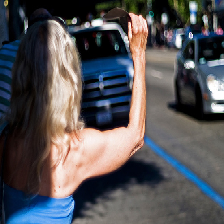

[[('n03255030', 'dumbbell', 0.92598456),
  ('n03417042', 'garbage_truck', 0.008531806),
  ('n04023962', 'punching_bag', 0.0065466426),
  ('n02790996', 'barbell', 0.0059150527),
  ('n02841315', 'binoculars', 0.0053636255)]]

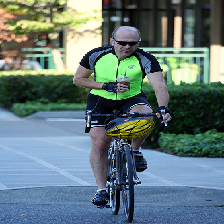

[[('n02835271', 'bicycle-built-for-two', 0.7726447),
  ('n03127747', 'crash_helmet', 0.15318125),
  ('n04482393', 'tricycle', 0.017521456),
  ('n03792782', 'mountain_bike', 0.0055093444),
  ('n04509417', 'unicycle', 0.0052397)]]

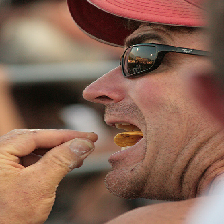

[[('n04355933', 'sunglass', 0.255075),
  ('n03124170', 'cowboy_hat', 0.22518213),
  ('n04356056', 'sunglasses', 0.08223426),
  ('n03494278', 'harmonica', 0.05364288),
  ('n04357314', 'sunscreen', 0.0486737)]]

[None, None, None]

In [ ]:
list(map(lambda x: display(x[0],x[1]),resShow))

Вычисление векторов изображений для обоих датасетов

In [ ]:
vsTrain = list(map(ImgVectTrain,imgsTrain))

In [ ]:
vsTest = list(map(ImgVectTest,imgsTest))

In [ ]:
print("Количество векторизированных изображений vsTrain:", len(vsTrain))
print("Количество векторизированных изображений vsTest:", len(vsTest))

Количество векторизированных изображений vsTrain: 703
Количество векторизированных изображений vsTest: 100


In [ ]:
print("Размер вектора изображения:", len(vsTrain[0][1]))

Размер вектора изображения: 1000


Вывод: Размер вектора изображения: 1000
получившийся вектор v содержит в себе числа от 0 до 1, которые указывают вероятность принадлежания входной картинке к классу classes = {class1, class2, ...}, также длиной 1000
расшифровать v и сопоставить его с classes можно функцией decode_predictions()

## 4. Векторизация текстов

По заданию необходимо использовать tf-idf. Вычисление векторов запросов.

In [ ]:
trainQueries = dfWorkTrainCensored['lemmedLists'].apply(' '.join).tolist()
testQueries = dfWorkTestCensored['lemmedLists'].apply(' '.join).tolist()

In [ ]:
text2vector = TfidfVectorizer(stop_words=nltk.corpus.stopwords.words('english'),ngram_range=(1,2))

In [ ]:
text2vector.fit_transform(trainQueries)

<4044x4842 sparse matrix of type '<class 'numpy.float64'>'
	with 45122 stored elements in Compressed Sparse Row format>

## 5. Объединение векторов

Финальные датасеты с векторами изображений и запросов, а также дополнительной колонкой конкатренированных векторов изображений и запросов, которые и будут входными данными для тренировки

In [ ]:
dfVsTr = pd.DataFrame(vsTrain,columns=['image','imgV']).set_index('image')
dfVsTrain = dfWorkTrainCensored.copy()
dfVsTrain = dfVsTrain.set_axis(dfVsTrain['image'],axis=0)
dfVsTrain = dfVsTrain.join(dfVsTr['imgV'])
dfVsTrain.insert(6,'qV',dfVsTrain['lemmedLists'].apply(lambda x: text2vector.transform([' '.join(x)]).toarray()[0]))
dfVsTrain.insert(7,'v',dfVsTrain[['imgV','qV']].apply(np.concatenate,axis=1))
dfVsTrain

,image,query_id,query_text,lemmedLists,rating,imgV,qV,v
image,,,,,,,,
1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,"[a, young, child, be, wear, blue, goggle, and,...",0.000000,"[7.9562376e-08, 1.7632065e-07, 3.8637532e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[7.956237624284768e-08, 1.763206540772444e-07,..."
1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,"[a, girl, wear, a, yellow, shirt, and, sunglas...",0.066667,"[7.9562376e-08, 1.7632065e-07, 3.8637532e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[7.956237624284768e-08, 1.763206540772444e-07,..."
1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,"[a, man, sleep, under, a, blanket, on, a, city...",0.111111,"[7.9562376e-08, 1.7632065e-07, 3.8637532e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[7.956237624284768e-08, 1.763206540772444e-07,..."
1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,"[a, woman, play, with, long, red, ribbons, in,...",0.222222,"[7.9562376e-08, 1.7632065e-07, 3.8637532e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[7.956237624284768e-08, 1.763206540772444e-07,..."
1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,"[chinese, market, street, in, the, winter, tim...",0.111111,"[7.9562376e-08, 1.7632065e-07, 3.8637532e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[7.956237624284768e-08, 1.763206540772444e-07,..."
...,...,...,...,...,...,...,...,...
997722733_0cb5439472.jpg,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,A man sitting on a subway .,"[a, man, sit, on, a, subway, .]",0.000000,"[2.3433758e-08, 6.2083956e-08, 1.4257355e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.3433758045143804e-08, 6.208395575413306e-08..."
997722733_0cb5439472.jpg,997722733_0cb5439472.jpg,2968182121_b3b491df85.jpg#2,Two greyhounds race .,"[two, greyhounds, race, .]",0.000000,"[2.3433758e-08, 6.2083956e-08, 1.4257355e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.3433758045143804e-08, 6.208395575413306e-08..."
997722733_0cb5439472.jpg,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,A man wearing a red hat looks down as another ...,"[a, man, wear, a, red, hat, look, down, as, an...",0.066667,"[2.3433758e-08, 6.2083956e-08, 1.4257355e-05, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.3433758045143804e-08, 6.208395575413306e-08..."


In [ ]:
dfVsTe = pd.DataFrame(vsTest,columns=['image','imgV']).set_index('image')
dfVsTest = dfWorkTestCensored.copy()
dfVsTest = dfVsTest.set_axis(dfVsTest['image'],axis=0)
dfVsTest = dfVsTest.join(dfVsTe['imgV'])
dfVsTest.insert(6,'decode',dfVsTest['imgV'].apply(lambda x:np.transpose(decode_predictions(np.array([x])))[1]))
dfVsTest.insert(6,'qV',dfVsTest['lemmedLists'].apply(lambda x: text2vector.transform([' '.join(x)]).toarray()[0]))
dfVsTest.insert(7,'v',dfVsTest[['imgV','qV']].apply(np.concatenate,axis=1))
dfVsTest

,image,query_id,query_text,lemmedLists,rating,imgV,qV,v,decode
image,,,,,,,,,
1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...","[two, blonde, boys, ,, one, in, a, camouflage,...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet..."
1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,"[two, boys, be, squirt, water, gun, at, each, ...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet..."
1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,"[two, boys, spray, each, other, with, water]",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet..."
1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,"[two, children, wear, jeans, squirt, water, at...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet..."
1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,"[two, young, boys, be, squirt, water, at, each...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet..."
...,...,...,...,...,...,...,...,...,...
989851184_9ef368e520.jpg,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#0,A black dog has a dumbbell in his mouth .,"[a, black, dog, have, a, dumbbell, in, his, mo...",1.0,"[1.300195e-08, 4.3731454e-09, 5.8149094e-09, 1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3001949739077645e-08, 4.373145401359579e-09...","[[standard_poodle], [Irish_water_spaniel], [mi..."
989851184_9ef368e520.jpg,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#1,A black dog has a dumbbell in his mouth lookin...,"[a, black, dog, have, a, dumbbell, in, his, mo...",1.0,"[1.300195e-08, 4.3731454e-09, 5.8149094e-09, 1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3001949739077645e-08, 4.373145401359579e-09...","[[standard_poodle], [Irish_water_spaniel], [mi..."
989851184_9ef368e520.jpg,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#2,A black dog holding a weight in its mouth stan...,"[a, black, dog, hold, a, weight, in, its, mout...",1.0,"[1.300195e-08, 4.3731454e-09, 5.8149094e-09, 1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3001949739077645e-08, 4.373145401359579e-09...","[[standard_poodle], [Irish_water_spaniel], [mi..."


Разделение тренировочного датасета на тренировочный и тестовый, т.к. датасет с названием тестовый уже есть и он берётся из файла, то этот будет называться валидационный.  
Соответственно после gss получается тренировочный и валидационный.

In [ ]:
[dfTTrain,dfTValid]=list(map(
    lambda x: dfVsTrain.iloc[x],
    next(GroupShuffleSplit(n_splits=1,train_size=0.75,random_state=42).split(X=dfVsTrain.drop(columns=['rating']),y=dfVsTrain['rating'],groups=dfVsTrain['image']))
))

Конец подготовки данных: входящие данные In, выходящие данные Out, параметрическая длина для тренировки и настройки для тренировки.

In [ ]:
trainIn = cast(stack(dfTTrain['v']),np.float32)
lIn = trainIn.shape[1]
lTrain = trainIn.shape[0]
trainOut = cast(reshape(stack(dfTTrain['rating']),(lTrain,1)),np.float32)
valIn = cast(stack(dfTValid['v']),np.float32)
lVal = valIn.shape[0]
valOut = cast(reshape(stack(dfTValid['rating']),(lVal,1)),np.float32)
[lr,epochs,dMSE] = [0.1,30,1e-3]

На вход будет подаваться вектор размера lIn где первые 1000 чисел - это вектор изображения, а остальные числа - вектор запроса. На выход будет подаваться число, которое представляет собой рейтинг изображения

In [ ]:
print(lIn)

5842


## 6. Обучение модели предсказания соответствия

По заданию, предстоит выбрать метрику качества либо реализовать свою.

В качестве функции потерь (loss function) выбрана средняя квадратичная ошибка (Mean Squared Error, MSE). MSE является одной из наиболее распространенных и популярных функций потерь для задачи регрессии. Она измеряет среднее квадратичное отклонение между предсказаниями модели и истинными значениями целевой переменной.

Выбор MSE в задаче регрессии обусловлен несколькими причинами:

MSE является дифференцируемой функцией потерь, что позволяет использовать градиентные методы оптимизации для обучения модели.
MSE штрафует большие отклонения между предсказаниями и истинными значениями сильнее, чем маленькие отклонения, что делает его чувствительным к большим ошибкам.
MSE имеет математический смысл и является естественной метрикой для сравнения модели с истинными значениями в задаче регрессии.
Таким образом, выбор MSE в данном случае обусловлен его свойствами и соответствием задаче регрессии, где требуется минимизировать разницу между предсказаниями модели и истинными значениями.

### 6.1 **Линейная модель**

Модель с одним слоем (не считая нормализации) и без нелинейной функциии активации -- по сути линейная регрессия.  


В итоге нужно получить число (рейтинг), поэтому строится модель с одним dense слоем который трансформирует входящий вектор в вектор длиной 1 то есть число

In [ ]:
lr = Sequential([
    Normalization(input_shape=[lIn,],axis=None),
    Dense(1)
])
lr.compile(optimizer=Adam(),loss=MeanSquaredError(),metrics=['mse'])

In [ ]:
lrHistory = lr.fit(trainIn,trainOut,batch_size=200,epochs=20,validation_data=(valIn,valOut))

Epoch 1/20
16/16 [==============================] - 1s 19ms/step - loss: 0.0967 - mse: 0.0967 - val_loss: 0.1011 - val_mse: 0.1011
Epoch 2/20
16/16 [==============================] - 0s 11ms/step - loss: 0.0807 - mse: 0.0807 - val_loss: 0.0891 - val_mse: 0.0891
Epoch 3/20
16/16 [==============================] - 0s 8ms/step - loss: 0.0703 - mse: 0.0703 - val_loss: 0.0820 - val_mse: 0.0820
Epoch 4/20
16/16 [==============================] - 0s 8ms/step - loss: 0.0634 - mse: 0.0634 - val_loss: 0.0775 - val_mse: 0.0775
Epoch 5/20
16/16 [==============================] - 0s 8ms/step - loss: 0.0589 - mse: 0.0589 - val_loss: 0.0748 - val_mse: 0.0748
Epoch 6/20
16/16 [==============================] - 0s 10ms/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0731 - val_mse: 0.0731
Epoch 7/20
16/16 [==============================] - 0s 7ms/step - loss: 0.0529 - mse: 0.0529 - val_loss: 0.0719 - val_mse: 0.0719
Epoch 8/20
16/16 [==============================] - 0s 9ms/step - loss: 0.0510 - mse: 0

Выбирается изображение с которым будет происходить сравнение, называется проверочным

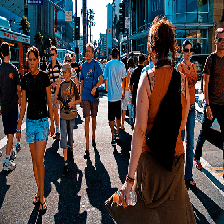

'A group of people walking a city street in warm weather .'

In [ ]:
checkTrain = dfTTrain.loc[dfTTrain['rating']==1.0].iloc[0]
display(load_img(path+'/to_upload/train_images/'+checkTrain['image'],target_size=(224,224)))
display(checkTrain['query_text'])

Добавляем столбец с искомым вектором (конкатенация вектора изображения и вектора запроса проверочного изображения)  

а также результаты предсказания рейтинга для  
    - вектора изображения и соответсвующего ему вектора запроса из заданного валидационного датасета  
    - вектора изображения и вектора проверочного запроса (чем больше оценка тем более вероятно изображение и запрос совпадают)

In [ ]:
dfLrShow = dfTTrain.copy()
dfLrShow.insert(8,'searchV',dfLrShow['imgV'].apply(lambda x: np.concatenate([x,checkTrain['qV']])))
dfLrShow.insert(9,'lrRat',lr.predict(stack(dfLrShow['v'])))
dfLrShow.insert(10,'lrError',dfLrShow[['rating','lrRat']].apply(lambda x: abs(x[0]-x[1]),axis=1))
dfLrShow.insert(11,'lrSearch',lr.predict(stack(dfLrShow['searchV'])))
dfLrShow = dfLrShow.sort_values(by='lrSearch',ascending=False)
dfLrShow

94/94 [==============================] - 0s 3ms/step


,image,query_id,query_text,lemmedLists,rating,imgV,qV,v,searchV,lrRat,lrError,lrSearch
image,,,,,,,,,,,,
3375070563_3c290a7991.jpg,3375070563_3c290a7991.jpg,3227148358_f152303584.jpg#2,A large white bird flying over water .,"[a, large, white, bird, fly, over, water, .]",0.866667,"[5.767003e-09, 2.2716591e-08, 3.931519e-06, 4....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.767002875245453e-09, 2.271659127472958e-08,...","[5.767002875245453e-09, 2.271659127472958e-08,...",0.404595,0.462072,0.428296
3375070563_3c290a7991.jpg,3375070563_3c290a7991.jpg,2495931537_9b8d4474b6.jpg#2,Dog sniffing another dog lying under furniture .,"[dog, sniff, another, dog, lie, under, furnitu...",0.000000,"[5.767003e-09, 2.2716591e-08, 3.931519e-06, 4....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.767002875245453e-09, 2.271659127472958e-08,...","[5.767002875245453e-09, 2.271659127472958e-08,...",0.245915,0.245915,0.428296
3375070563_3c290a7991.jpg,3375070563_3c290a7991.jpg,3567061016_62768dcce1.jpg#2,A bird with its wings spread,"[a, bird, with, its, wing, spread]",1.000000,"[5.767003e-09, 2.2716591e-08, 3.931519e-06, 4....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.767002875245453e-09, 2.271659127472958e-08,...","[5.767002875245453e-09, 2.271659127472958e-08,...",0.337950,0.662050,0.428296
3375070563_3c290a7991.jpg,3375070563_3c290a7991.jpg,3375070563_3c290a7991.jpg#2,A white birds lands swiftly in the water .,"[a, white, bird, land, swiftly, in, the, water...",0.666667,"[5.767003e-09, 2.2716591e-08, 3.931519e-06, 4....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.767002875245453e-09, 2.271659127472958e-08,...","[5.767002875245453e-09, 2.271659127472958e-08,...",0.306777,0.359889,0.428296
241347760_d44c8d3a01.jpg,241347760_d44c8d3a01.jpg,3498997518_c2b16f0a0e.jpg#2,A football player is tackling the player with ...,"[a, football, player, be, tackle, the, player,...",0.200000,"[8.3899953e-16, 2.2267856e-16, 4.0726263e-13, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[8.389995279638629e-16, 2.2267855614649195e-16...","[8.389995279638629e-16, 2.2267855614649195e-16...",0.352310,0.152310,0.425792
...,...,...,...,...,...,...,...,...,...,...,...,...
3437654963_c4fdc17e8b.jpg,3437654963_c4fdc17e8b.jpg,2101457132_69c950bc45.jpg#2,A black dog jumping off a river bank near a wo...,"[a, black, dog, jump, off, a, river, bank, nea...",0.000000,"[1.0630344e-11, 4.2336898e-11, 7.535524e-09, 9...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.063034382742245e-11, 4.2336897876360524e-11...","[1.063034382742245e-11, 4.2336897876360524e-11...",-0.047889,0.047889,0.142322
3437654963_c4fdc17e8b.jpg,3437654963_c4fdc17e8b.jpg,3216926094_bc975e84b9.jpg#2,A dog running with a blue toy in its mouth .,"[a, dog, run, with, a, blue, toy, in, its, mou...",0.000000,"[1.0630344e-11, 4.2336898e-11, 7.535524e-09, 9...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.063034382742245e-11, 4.2336897876360524e-11...","[1.063034382742245e-11, 4.2336897876360524e-11...",0.114424,0.114424,0.142322
3437654963_c4fdc17e8b.jpg,3437654963_c4fdc17e8b.jpg,3263395801_5e4cee2b9e.jpg#2,A motocross bike is being ridden along a woodl...,"[a, motocross, bike, be, be, ride, along, a, w...",0.000000,"[1.0630344e-11, 4.2336898e-11, 7.535524e-09, 9...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.063034382742245e-11, 4.2336897876360524e-11...","[1.063034382742245e-11, 4.2336897876360524e-11...",0.020079,0.020079,0.142322


A group of people walking a city street in warm weather .


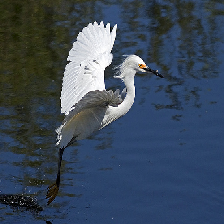

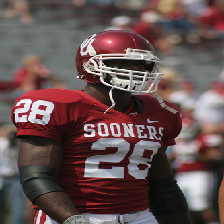

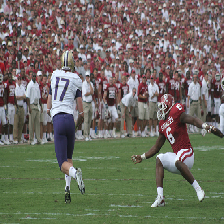

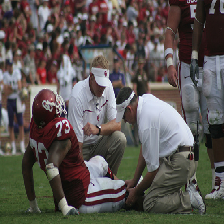

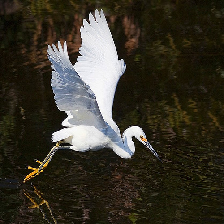

In [ ]:
#print(checkTrain['query_text'])
#for i in dfLrShow['image'].drop_duplicates().tolist()[:5]:
    #display(load_img('data/to_upload/train_images/'+i,target_size=(224,224)))

print(checkTrain['query_text'])
for i in dfLrShow['image'].drop_duplicates().tolist()[:5]:
    display(load_img(path+'/to_upload/train_images/'+i,target_size=(224,224)))

### 6.2 Теперь по заданию, задаем нейросеть на Keras

In [ ]:
nn = Sequential([
    Normalization(input_shape=[lIn,],axis=None),
    Dense(lIn,activation='relu'),
    Dense(1,activation='relu'),
])
nn.compile(optimizer=Adam(),loss=MeanSquaredError(),metrics=['mse'])

In [ ]:
history = nn.fit(trainIn,trainOut,batch_size=200,epochs=20,validation_data=(valIn,valOut))

Epoch 1/20
16/16 [==============================] - 17s 998ms/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0729 - val_mse: 0.0729
Epoch 2/20
16/16 [==============================] - 16s 985ms/step - loss: 0.0402 - mse: 0.0402 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 3/20
16/16 [==============================] - 16s 985ms/step - loss: 0.0298 - mse: 0.0298 - val_loss: 0.0742 - val_mse: 0.0742
Epoch 4/20
16/16 [==============================] - 18s 1s/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.0738 - val_mse: 0.0738
Epoch 5/20
16/16 [==============================] - 16s 995ms/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0759 - val_mse: 0.0759
Epoch 6/20
16/16 [==============================] - 16s 997ms/step - loss: 0.0186 - mse: 0.0186 - val_loss: 0.0770 - val_mse: 0.0770
Epoch 7/20
16/16 [==============================] - 16s 994ms/step - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0785 - val_mse: 0.0785
Epoch 8/20
16/16 [==============================] - 17s 1s/step - loss: 

In [ ]:
dfNNShow = dfLrShow.copy()
dfNNShow.insert(12,'nnRat',nn.predict(stack(dfNNShow['v'])))
dfNNShow.insert(13,'nnError',dfNNShow[['rating','nnRat']].apply(lambda x: abs(x[0]-x[1]),axis=1))
dfNNShow.insert(14,'nnSearch',nn.predict(stack(dfNNShow['searchV'])))
dfNNShow = dfNNShow.sort_values(by='nnSearch',ascending=False)
dfNNShow

94/94 [==============================] - 7s 75ms/step


,image,query_id,query_text,lemmedLists,rating,imgV,qV,v,searchV,lrRat,lrError,lrSearch,nnRat,nnError,nnSearch
image,,,,,,,,,,,,,,,
1174629344_a2e1a2bdbf.jpg,1174629344_a2e1a2bdbf.jpg,3497224764_6e17544e0d.jpg#2,A woman writing while standing by men .,"[a, woman, write, while, stand, by, men, .]",0.111111,"[5.776955e-10, 1.342987e-06, 1.8987232e-05, 1....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.776955025460495e-10, 1.3429870477921213e-06...","[5.776955025460495e-10, 1.3429870477921213e-06...",0.086055,0.025056,0.346576,0.000000,0.111111,0.719843
1174629344_a2e1a2bdbf.jpg,1174629344_a2e1a2bdbf.jpg,1329832826_432538d331.jpg#2,People waiting to cross the street in front of...,"[people, wait, to, cross, the, street, in, fro...",0.200000,"[5.776955e-10, 1.342987e-06, 1.8987232e-05, 1....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.776955025460495e-10, 1.3429870477921213e-06...","[5.776955025460495e-10, 1.3429870477921213e-06...",0.162353,0.037647,0.346576,0.000000,0.200000,0.719843
1174629344_a2e1a2bdbf.jpg,1174629344_a2e1a2bdbf.jpg,3259666643_ae49524c81.jpg#2,A man in a white uniform jumps while holding a...,"[a, man, in, a, white, uniform, jump, while, h...",0.111111,"[5.776955e-10, 1.342987e-06, 1.8987232e-05, 1....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.776955025460495e-10, 1.3429870477921213e-06...","[5.776955025460495e-10, 1.3429870477921213e-06...",0.243025,0.131914,0.346576,0.152448,0.041337,0.719843
1174629344_a2e1a2bdbf.jpg,1174629344_a2e1a2bdbf.jpg,3365783912_e12c3510d8.jpg#2,Two men walk through a city with words on the ...,"[two, men, walk, through, a, city, with, word,...",0.266667,"[5.776955e-10, 1.342987e-06, 1.8987232e-05, 1....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.776955025460495e-10, 1.3429870477921213e-06...","[5.776955025460495e-10, 1.3429870477921213e-06...",0.254874,0.011793,0.346576,0.000000,0.266667,0.719843
1174629344_a2e1a2bdbf.jpg,1174629344_a2e1a2bdbf.jpg,1174629344_a2e1a2bdbf.jpg#2,A group of people walking a city street in war...,"[a, group, of, people, walk, a, city, street, ...",1.000000,"[5.776955e-10, 1.342987e-06, 1.8987232e-05, 1....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[5.776955025460495e-10, 1.3429870477921213e-06...","[5.776955025460495e-10, 1.3429870477921213e-06...",0.346576,0.653424,0.346576,0.719843,0.280157,0.719843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3358682439_be4b83544c.jpg,3358682439_be4b83544c.jpg,3074842262_62b1b2168c.jpg#2,A kid in a blue top leaps into a raked pile of...,"[a, kid, in, a, blue, top, leap, into, a, rake...",0.000000,"[2.2367403e-06, 1.5001419e-08, 9.653756e-07, 5...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.2367403289536014e-06, 1.5001418773863406e-0...","[2.2367403289536014e-06, 1.5001418773863406e-0...",-0.042610,0.042610,0.246327,0.000000,0.000000,0.000000
3358682439_be4b83544c.jpg,3358682439_be4b83544c.jpg,1446053356_a924b4893f.jpg#2,Two girls in soccer strips are playing on a sp...,"[two, girls, in, soccer, strip, be, play, on, ...",0.133333,"[2.2367403e-06, 1.5001419e-08, 9.653756e-07, 5...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.2367403289536014e-06, 1.5001418773863406e-0...","[2.2367403289536014e-06, 1.5001418773863406e-0...",0.119696,0.013638,0.246327,0.000000,0.133333,0.000000
3358682439_be4b83544c.jpg,3358682439_be4b83544c.jpg,2856080862_95d793fa9d.jpg#2,Men playing soccer in a field,"[men, play, soccer, in, a, field]",0.066667,"[2.2367403e-06, 1.5001419e-08, 9.653756e-07, 5...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.2367403289536014e-06, 1.5001418773863406e-0...","[2.2367403289536014e-06, 1.5001418773863406e-0...",0.188742,0.122075,0.246327,0.000000,0.066667,0.000000


A group of people walking a city street in warm weather .


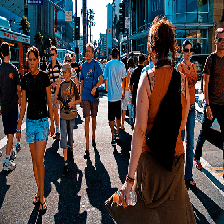

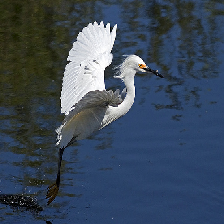

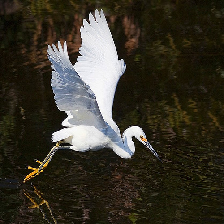

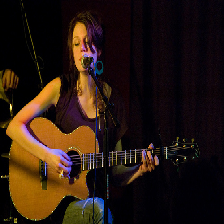

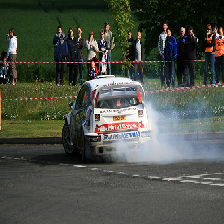

In [ ]:
print(checkTrain['query_text'])
for i in dfNNShow['image'].drop_duplicates().tolist()[:5]:
    display(load_img(path+'/to_upload/train_images/'+i,target_size=(224,224)))

In [ ]:
dfValShow = dfTValid.copy()
dfValShow.insert(8,'lrR',reshape(lr.predict(stack(dfValShow['v'])),(lVal)))
dfValShow.insert(9,'nnR',reshape(nn.predict(stack(dfValShow['v'])),(lVal)))
dfValShow.insert(10,'lrError',dfValShow[['rating','lrR']].apply(lambda x: x[0]-x[1],axis=1))
dfValShow.insert(11,'nnError',dfValShow[['rating','nnR']].apply(lambda x: x[0]-x[1],axis=1))
dfValShow

33/33 [==============================] - 2s 63ms/step


,image,query_id,query_text,lemmedLists,rating,imgV,qV,v,lrR,nnR,lrError,nnError
image,,,,,,,,,,,,
1084040636_97d9633581.jpg,1084040636_97d9633581.jpg,2358554995_54ed3baa83.jpg#2,A child is preparing to slide down a piece of ...,"[a, child, be, prepare, to, slide, down, a, pi...",0.000000,"[1.34055975e-08, 6.473334e-08, 1.5310551e-06, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3405597520943502e-08, 6.473334224210703e-08...",0.024875,0.000000,-0.024875,0.000000
1084040636_97d9633581.jpg,1084040636_97d9633581.jpg,2544426580_317b1f1f73.jpg#2,The baby in suspenders sits by a toy .,"[the, baby, in, suspenders, sit, by, a, toy, .]",0.000000,"[1.34055975e-08, 6.473334e-08, 1.5310551e-06, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3405597520943502e-08, 6.473334224210703e-08...",0.028684,0.000000,-0.028684,0.000000
1084040636_97d9633581.jpg,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,Close-up of dog in profile with mouth open .,"[close-up, of, dog, in, profile, with, mouth, ...",0.466667,"[1.34055975e-08, 6.473334e-08, 1.5310551e-06, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3405597520943502e-08, 6.473334224210703e-08...",0.302439,0.353423,0.164228,0.113243
1084040636_97d9633581.jpg,1084040636_97d9633581.jpg,3385593926_d3e9c21170.jpg#2,Two brown dogs playfully fight in the snow .,"[two, brown, dog, playfully, fight, in, the, s...",0.222222,"[1.34055975e-08, 6.473334e-08, 1.5310551e-06, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3405597520943502e-08, 6.473334224210703e-08...",0.311166,0.245871,-0.088943,-0.023649
1084040636_97d9633581.jpg,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,A dog gets on a trampoline .,"[a, dog, get, on, a, trampoline, .]",0.133333,"[1.34055975e-08, 6.473334e-08, 1.5310551e-06, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3405597520943502e-08, 6.473334224210703e-08...",0.164501,0.000000,-0.031168,0.133333
...,...,...,...,...,...,...,...,...,...,...,...,...
925491651_57df3a5b36.jpg,925491651_57df3a5b36.jpg,2196846255_2c1635359a.jpg#2,A wrinkled dog wading in shallow water .,"[a, wrinkle, dog, wad, in, shallow, water, .]",0.333333,"[1.4245662e-09, 5.2295634e-10, 1.4402463e-08, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.4245662427470052e-09, 5.229563448949648e-10...",0.352420,0.111102,-0.019086,0.222231
925491651_57df3a5b36.jpg,925491651_57df3a5b36.jpg,925491651_57df3a5b36.jpg#2,A tan dog jumps into water .,"[a, tan, dog, jump, into, water, .]",0.866667,"[1.4245662e-09, 5.2295634e-10, 1.4402463e-08, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.4245662427470052e-09, 5.229563448949648e-10...",0.316014,0.234347,0.550653,0.632320
925491651_57df3a5b36.jpg,925491651_57df3a5b36.jpg,1224851143_33bcdd299c.jpg#2,A little boy is eating his food off of a spoon...,"[a, little, boy, be, eat, his, food, off, of, ...",0.000000,"[1.4245662e-09, 5.2295634e-10, 1.4402463e-08, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.4245662427470052e-09, 5.229563448949648e-10...",0.017642,0.000000,-0.017642,0.000000


In [ ]:
dfTestShow = dfVsTest.copy()
dfTestShow.insert(9,'lrRating',lr.predict(stack(dfTestShow['v'])))
dfTestShow.insert(10,'nnRating',nn.predict(stack(dfTestShow['v'])))
dfTestShow.insert(11,'lrError',dfTestShow[['rating','lrRating']].apply(lambda x: abs(x[0]-x[1]),axis=1))
dfTestShow.insert(12,'nnError',dfTestShow[['rating','nnRating']].apply(lambda x: abs(x[0]-x[1]),axis=1))
dfTestShow = dfTestShow.set_axis(range(len(dfTestShow)),axis=0)
dfTestShow

16/16 [==============================] - 1s 62ms/step


,image,query_id,query_text,lemmedLists,rating,imgV,qV,v,decode,lrRating,nnRating,lrError,nnError
0,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...","[two, blonde, boys, ,, one, in, a, camouflage,...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet...",0.227693,0.120578,0.772307,0.879422
1,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,"[two, boys, be, squirt, water, gun, at, each, ...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet...",0.124223,0.000000,0.875777,1.000000
2,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,"[two, boys, spray, each, other, with, water]",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet...",0.126947,0.000000,0.873053,1.000000
3,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,"[two, children, wear, jeans, squirt, water, at...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet...",0.092002,0.000000,0.907998,1.000000
4,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,"[two, young, boys, be, squirt, water, at, each...",1.0,"[4.336012e-05, 7.723694e-06, 0.0010062967, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.3360119889257476e-05, 7.723693670413923e-06...","[[sweatshirt], [French_horn], [football_helmet...",0.151426,0.004973,0.848574,0.995027
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#0,A black dog has a dumbbell in his mouth .,"[a, black, dog, have, a, dumbbell, in, his, mo...",1.0,"[1.300195e-08, 4.3731454e-09, 5.8149094e-09, 1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3001949739077645e-08, 4.373145401359579e-09...","[[standard_poodle], [Irish_water_spaniel], [mi...",0.272482,0.300499,0.727518,0.699501
496,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#1,A black dog has a dumbbell in his mouth lookin...,"[a, black, dog, have, a, dumbbell, in, his, mo...",1.0,"[1.300195e-08, 4.3731454e-09, 5.8149094e-09, 1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3001949739077645e-08, 4.373145401359579e-09...","[[standard_poodle], [Irish_water_spaniel], [mi...",0.315389,0.347004,0.684611,0.652996
497,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#2,A black dog holding a weight in its mouth stan...,"[a, black, dog, hold, a, weight, in, its, mout...",1.0,"[1.300195e-08, 4.3731454e-09, 5.8149094e-09, 1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3001949739077645e-08, 4.373145401359579e-09...","[[standard_poodle], [Irish_water_spaniel], [mi...",0.265719,0.223841,0.734281,0.776159
498,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#3,A black dog holds a small white dumbbell in it...,"[a, black, dog, hold, a, small, white, dumbbel...",1.0,"[1.300195e-08, 4.3731454e-09, 5.8149094e-09, 1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.3001949739077645e-08, 4.373145401359579e-09...","[[standard_poodle], [Irish_water_spaniel], [mi...",0.213868,0.138777,0.786132,0.861223


Выведем среднеквадратичную ошибку моделей линейной регрессии и нейросети на тренировочном, валидационном и тестовом датасетах.

In [ ]:
lTest = len(dfTestShow)

In [ ]:
print(sum(dfNNShow['lrError'].apply(lambda x: x*x))/lTrain)
print(sum(dfNNShow['nnError'].apply(lambda x: x*x))/lTrain)
print(sum(dfValShow['lrError'].apply(lambda x: x*x))/lVal)
print(sum(dfValShow['nnError'].apply(lambda x: x*x))/lVal)
print(sum(dfTestShow['lrError'].apply(lambda x: x*x))/lTest)
print(sum(dfTestShow['nnError'].apply(lambda x: x*x))/lTest)

0.04055757373945779
0.015733055610935617
0.06999854755851007
0.08062067940410726
0.6581882553109095
0.8664818515425536


процент большой (>0.25) ошибки

In [ ]:
print(len(dfNNShow['lrError'].loc[dfNNShow['lrError']>0.25])/lTrain*100)
print(len(dfNNShow['nnError'].loc[dfNNShow['nnError']>0.25])/lTrain*100)
print(len(dfValShow['lrError'].loc[dfValShow['lrError']>0.25])/lVal*100)
print(len(dfValShow['nnError'].loc[dfValShow['nnError']>0.25])/lVal*100)
print(len(dfTestShow['lrError'].loc[dfTestShow['lrError']>0.25])/lTest*100)
print(len(dfTestShow['nnError'].loc[dfTestShow['nnError']>0.25])/lTest*100)

15.156562291805464
3.8974017321785475
14.011516314779271
15.642994241842612
100.0
100.0


## 7. Тестирование модели

In [ ]:
def ShowLR(query,q):
    qVRaw = nltk.word_tokenize(lemm.lemmatize(query.lower(),pos='v'))
    if(any(list(map(lambda y: y in qVRaw,censor)))):
        print('This image is unavailable in your country in compliance with local laws')
        return False
    qV = text2vector.transform([' '.join(qVRaw)]).toarray()[0]
    dfShowLR = dfTestShow[['image','imgV']]
    dfShowLR.insert(2,'v',dfShowLR['imgV'].apply(lambda x: np.concatenate([x,qV])))
    dfShowLR.insert(3,'ratingLR',lr.predict(stack(dfShowLR['v'])))
    dfShowLR = dfShowLR.sort_values(by='ratingLR',ascending=False)
    images = dfShowLR['image'].drop_duplicates()
    print(query)
    for i in images.iloc[:q]:
        display(load_img(path+'/to_upload/test_images/'+i,target_size=(224,224)))
    return dfShowLR
def ShowNN(query,q):
    qVRaw = nltk.word_tokenize(lemm.lemmatize(query.lower(),pos='v'))
    if(any(list(map(lambda y: y in qVRaw,censor)))):
        print('This image is unavailable in your country in compliance with local laws')
        return False
    qV = text2vector.transform([' '.join(qVRaw)]).toarray()[0]
    dfShowLR = dfTestShow[['image','imgV']]
    dfShowLR.insert(2,'v',dfShowLR['imgV'].apply(lambda x: np.concatenate([x,qV])))
    dfShowLR.insert(3,'ratingNN',nn.predict(stack(dfShowLR['v'])))
    dfShowLR = dfShowLR.sort_values(by='ratingNN',ascending=False)
    images = dfShowLR['image'].drop_duplicates()
    print(query)
    for i in images.iloc[:q]:
        display(load_img(path+'/to_upload/test_images/'+i,target_size=(224,224)))
    return dfShowLR

работа линейной регрессии

16/16 [==============================] - 0s 2ms/step
A white dog and a black dog in a field


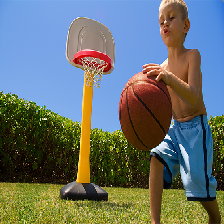

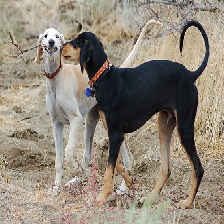

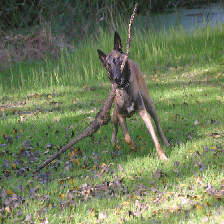

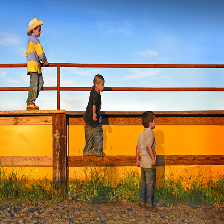

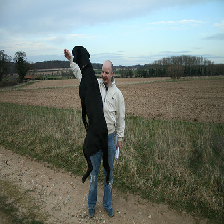

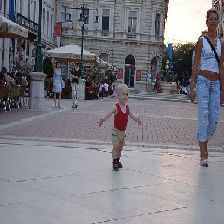

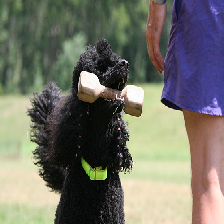

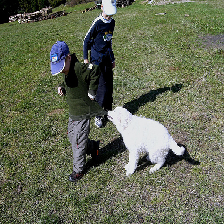

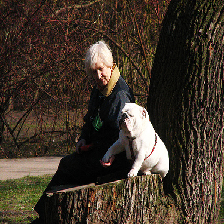

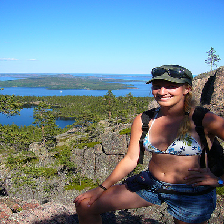

In [ ]:
dfLrQ1 = ShowLR('A white dog and a black dog in a field',10)

16/16 [==============================] - 0s 3ms/step
A man riding a motorcycle is performing a trick at a track


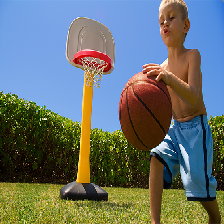

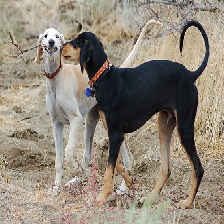

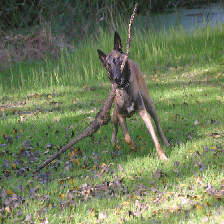

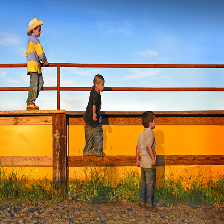

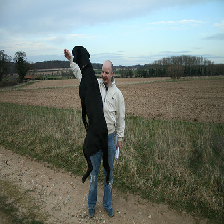

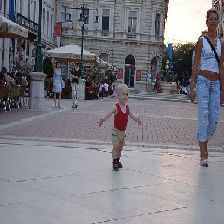

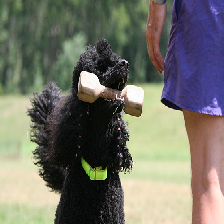

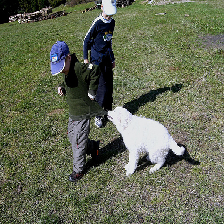

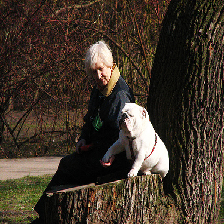

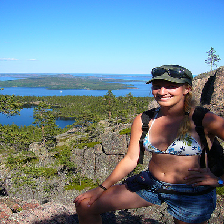

In [ ]:
dfLrQ2 = ShowLR('A man riding a motorcycle is performing a trick at a track',10)

Тестирование цензурированного контента

In [ ]:
dfLrQ3 = ShowLR('A child riding a motorcycle is performing a trick at a track',5)

This image is unavailable in your country in compliance with local laws


#### Промежуточный вывод: цензурирование сработает

Работа нейросети

16/16 [==============================] - 1s 64ms/step
A white dog and a black dog in a field


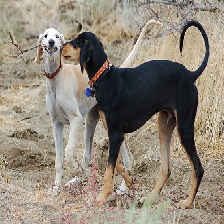

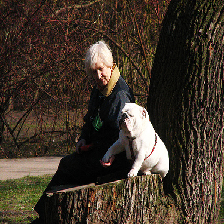

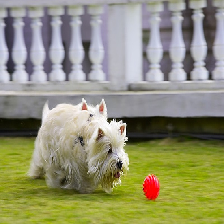

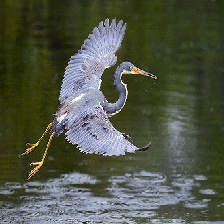

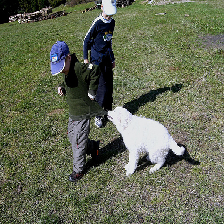

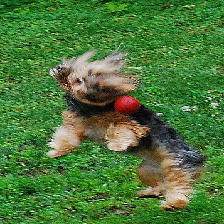

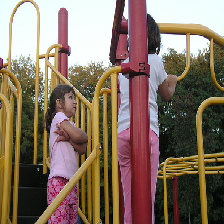

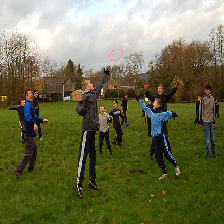

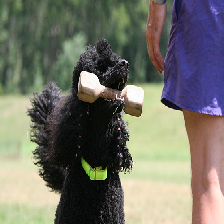

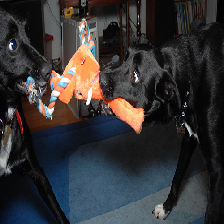

In [ ]:
dfNNQ1 = ShowNN('A white dog and a black dog in a field',10)

16/16 [==============================] - 1s 66ms/step
A man riding a motorcycle is performing a trick at a track


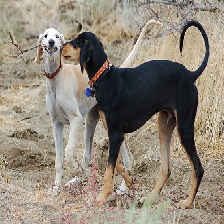

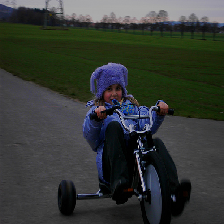

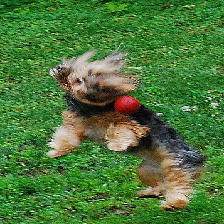

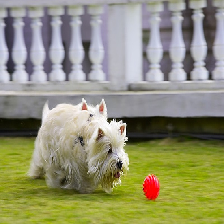

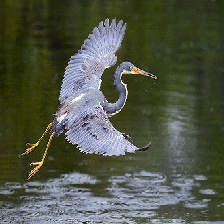

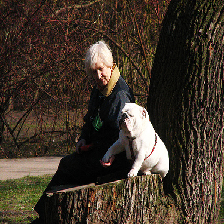

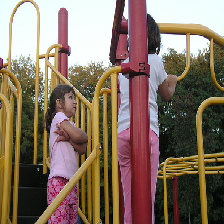

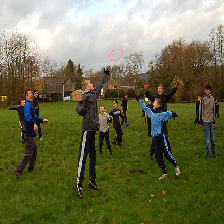

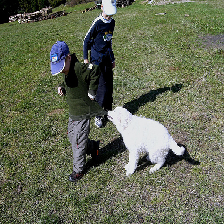

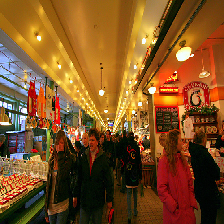

In [ ]:
dfNNQ2 = ShowNN('A man riding a motorcycle is performing a trick at a track',10)

In [ ]:
dfNNQ3 = ShowNN('A child riding a motorcycle is performing a trick at a track',5)

This image is unavailable in your country in compliance with local laws


#### Промежуточный вывод: цензурирование при использовании нейронной сети - срабатывает.

По заданию, выберем случайные 10 запросов из файла test_queries.csv и для каждого запроса выведем наиболее релевантное изображение

In [ ]:
queries = random.sample(dfTestShow['query_text'].tolist(),10)

16/16 [==============================] - 2s 114ms/step
The middle eastern woman wearing the pink headscarf is walking beside a woman in a purple headscarf .


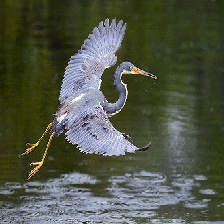

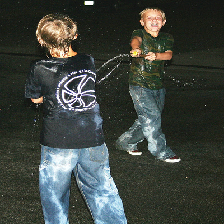

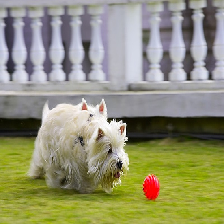

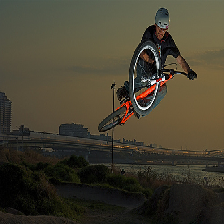

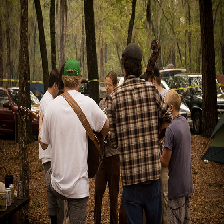

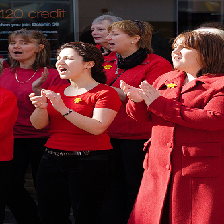

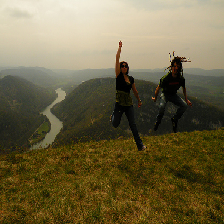

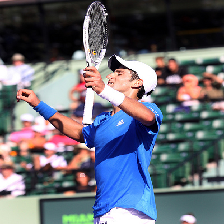

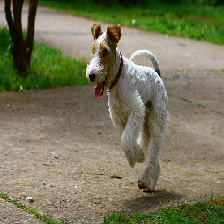

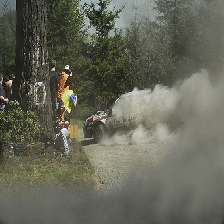

This image is unavailable in your country in compliance with local laws
This image is unavailable in your country in compliance with local laws
16/16 [==============================] - 1s 76ms/step
The man is performing a trick with an orange bicycle .


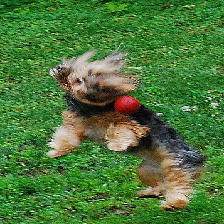

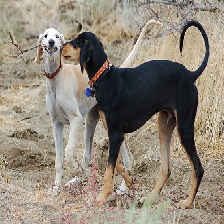

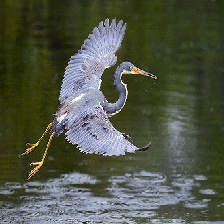

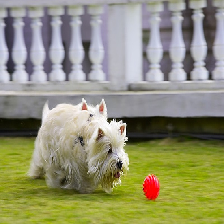

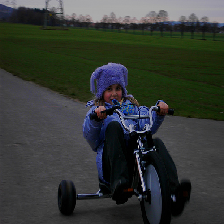

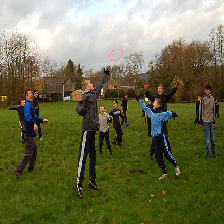

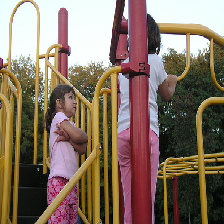

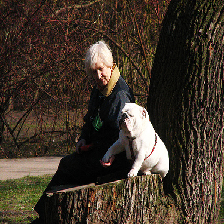

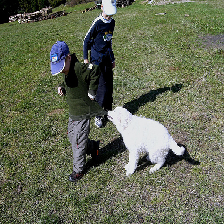

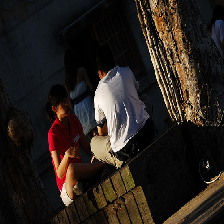

This image is unavailable in your country in compliance with local laws
This image is unavailable in your country in compliance with local laws
16/16 [==============================] - 1s 88ms/step
a boxer punches a boxer in the face .


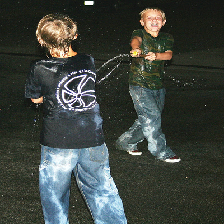

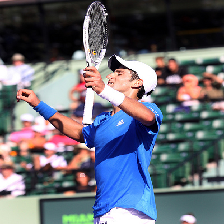

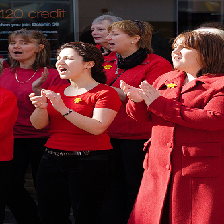

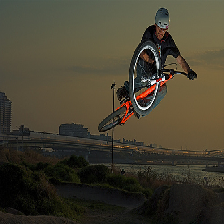

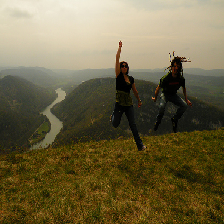

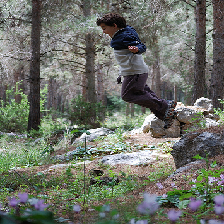

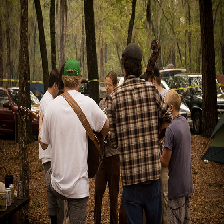

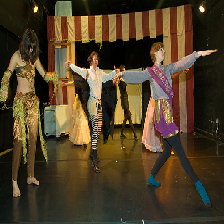

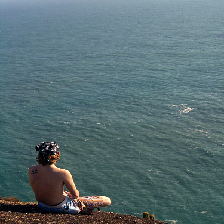

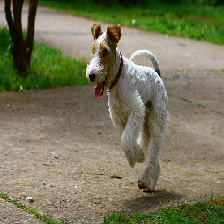

16/16 [==============================] - 2s 99ms/step
A man who is dressed like a wrestler walks while people take his picture .


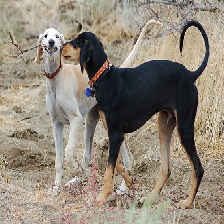

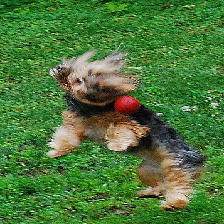

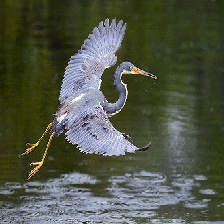

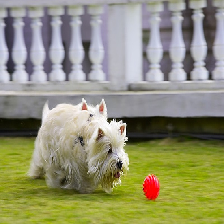

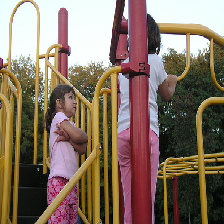

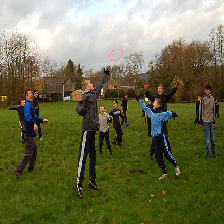

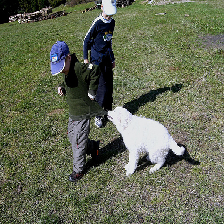

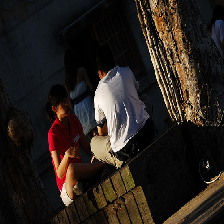

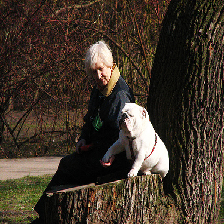

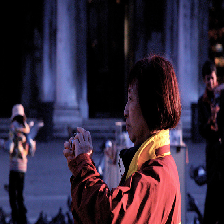

16/16 [==============================] - 2s 105ms/step
Three riders wearing black jerseys jump their BMX bikes into the air .


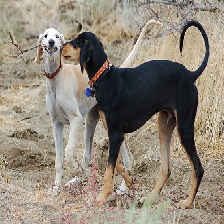

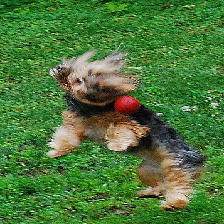

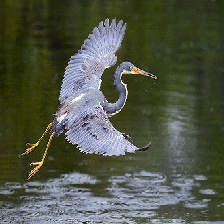

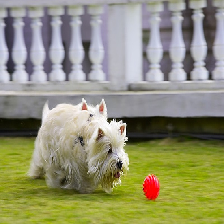

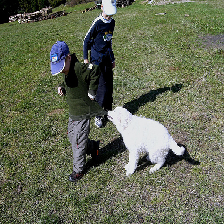

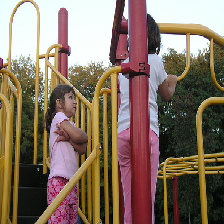

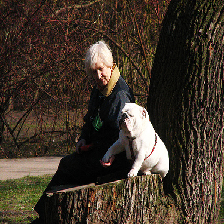

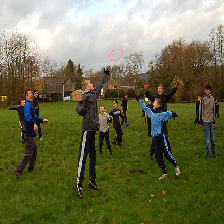

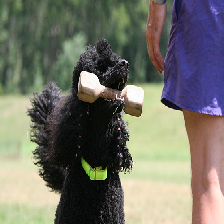

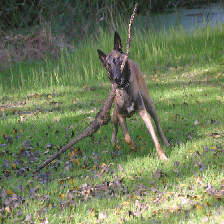

16/16 [==============================] - 2s 117ms/step
A white dog with a stick in his mouth standing next to a black dog .


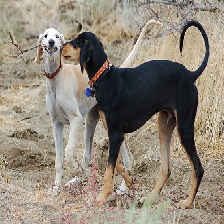

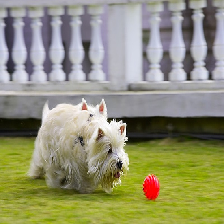

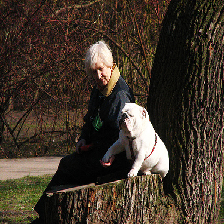

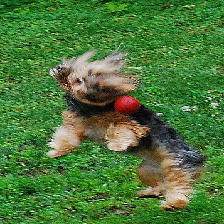

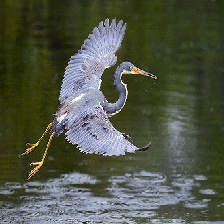

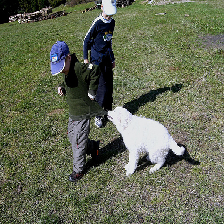

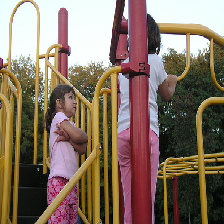

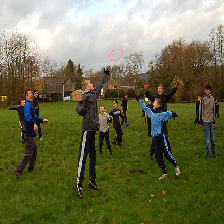

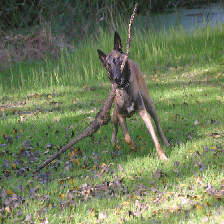

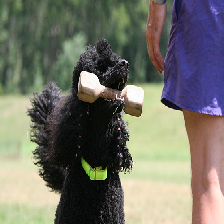

In [ ]:
for i in queries:
    ShowNN(i,10)

### Выводы:
 - Линейная регрессия и нейронная сеть на Keras выдают схожий результат, одинаково не точный. В то время как на изображении часто присутствует объект описания из запроса, остальной контекст может не соответствовать тому что на изображении. Возможные причины плохого результата работы обучения - маленький размер датасета.

Варианты

Трансформировать вектор запроса в вектор размера вектора изображения и измерить длину между трансформированным вектором и вектором изображения

In [ ]:
dfVar1 = dfVsTrain.loc[dfVsTrain['rating']>=0.5]

In [ ]:
[dfVar1T,dfVar1V] = list(map(
    lambda x: dfVar1.iloc[x],
    next(GroupShuffleSplit(n_splits=1,train_size=0.75,random_state=42).split(X=dfVar1.drop(columns=['rating']),y=dfVar1['rating'],groups=dfVar1['image']))
))

In [ ]:
Var1TIn = cast(stack(dfVar1T['qV']),np.float32)
Var1TOut = cast(stack(dfVar1T['imgV']),np.float32)
Var1TInL = Var1TIn.shape[1]
Var1TOutL = Var1TOut.shape[1]
Var1TL = Var1TIn.shape[0]
Var1VIn = cast(stack(dfVar1V['qV']),np.float32)
Var1VOut = cast(stack(dfVar1V['imgV']),np.float32)
Var1VL = Var1VIn.shape[0]

In [ ]:
nn1 = Sequential([
    Normalization(input_shape=[Var1TInL,],axis=None),
    Dense(Var1TInL,activation='relu'),
    Dropout(0.5),
    Dense(Var1TInL//2,activation='relu'),
    Dropout(0.5),
    Dense(Var1TInL//4,activation='relu'),
    Dropout(0.5),
    Dense(Var1TOutL,activation='relu'),
])
nn1.compile(optimizer=Adam(),loss=MeanSquaredError(),metrics=['mse'])

In [ ]:
nn1History = nn1.fit(Var1TIn,Var1TOut,batch_size=100,epochs=20,validation_data=(Var1VIn,Var1VOut))

Epoch 1/20
4/4 [==============================] - 6s 942ms/step - loss: 5.4291e-04 - mse: 5.4291e-04 - val_loss: 4.4435e-04 - val_mse: 4.4435e-04
Epoch 2/20
4/4 [==============================] - 3s 893ms/step - loss: 4.5188e-04 - mse: 4.5188e-04 - val_loss: 4.4361e-04 - val_mse: 4.4361e-04
Epoch 3/20
4/4 [==============================] - 4s 1s/step - loss: 4.4291e-04 - mse: 4.4291e-04 - val_loss: 4.4250e-04 - val_mse: 4.4250e-04
Epoch 4/20
4/4 [==============================] - 3s 858ms/step - loss: 4.4110e-04 - mse: 4.4110e-04 - val_loss: 4.4130e-04 - val_mse: 4.4130e-04
Epoch 5/20
4/4 [==============================] - 4s 992ms/step - loss: 4.4003e-04 - mse: 4.4003e-04 - val_loss: 4.4020e-04 - val_mse: 4.4020e-04
Epoch 6/20
4/4 [==============================] - 7s 2s/step - loss: 4.3960e-04 - mse: 4.3960e-04 - val_loss: 4.3964e-04 - val_mse: 4.3964e-04
Epoch 7/20
4/4 [==============================] - 6s 1s/step - loss: 4.3856e-04 - mse: 4.3856e-04 - val_loss: 4.3937e-04 - val_mse

In [ ]:
def ShowNN1(query,q):
    qVRaw = nltk.word_tokenize(lemm.lemmatize(query.lower(),pos='v'))
    if(any(list(map(lambda y: y in qVRaw,censor)))):
        print('This image is unavailable in your country in compliance with local laws')
        return False
    qV = text2vector.transform([' '.join(qVRaw)]).toarray()[0]
    dfShowNN1 = dfTestShow[['image','imgV']]
    imgV = nn1.predict(stack([qV]))[0]
    dfShowNN1.insert(2,'nn1V',dfShowNN1['imgV'].apply(lambda x: norm(imgV-x)))
    dfShowNN1 = dfShowNN1.sort_values(by='nn1V')
    images = dfShowNN1['image'].drop_duplicates()
    print(query)
    for i in images.iloc[:q]:
        display(load_img(path+'/to_upload/test_images/'+i,target_size=(224,224)))
    return dfShowNN1

1/1 [==============================] - 0s 92ms/step
A white dog and a black dog in a field


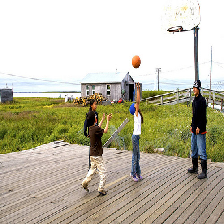

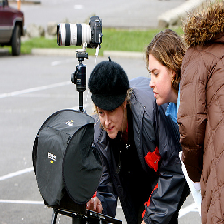

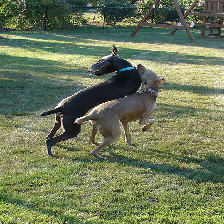

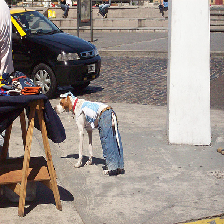

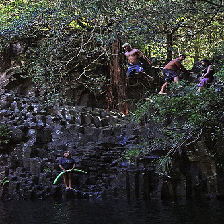

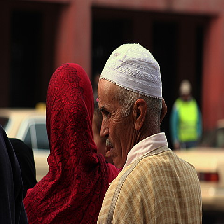

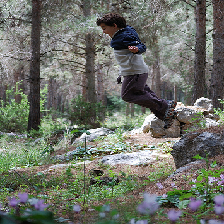

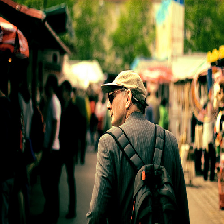

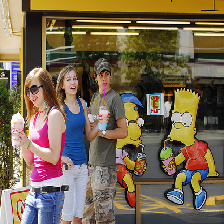

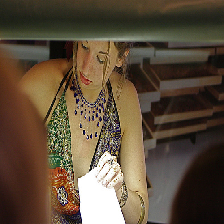

In [ ]:
dfNN1Q1 = ShowNN1('A white dog and a black dog in a field',10)

### Выводы:  


По заданию проекта, было поручено разработать демонстрационную версию поиска изображений по запросу.  

Для демонстрационной версии нужно было обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

Был проведен EDA:  
 - в `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания
 - в `test_queries.csv` собрана информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение
 - в `ExpertAnnotations.tsv` содержатся экспертные оценки соответствия текста и изображения
 - датасет `CrowdAnnotations.tsv` с краудсорсинговыми оценками.  


Были обработали экспертные и краудсорсинговые оценки, создали новые датафреймы с целевой переменной таргетом `rating` от 0 до 1.  


В некоторых странах, где работает наша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.   


Произвели лемматизацию текста. Задали цензуру, стоп-слова. Размер получившегося датасета `dfWorkTrainCensored` - `4214`. Размер датасета `dfWorkTestCensored` - `330`.  


В качестве цензуры, при срабатывании стоп-слов будет показываться заглушка: `This image is unavailable in your country in compliance with local laws`


Произвели векторизацию изображений, использоли `ResNet50`. Создали модель с предварительно обученными весами (weights='imagenet').  


Векторизация текстов сделали методом `tf-idf`.  


В качестве функции потерь (loss function) выбрана средняя квадратичная ошибка (Mean Squared Error, MSE).  


Задали Линейную модель, нейросеть на Keras.
Выбрали случайные 10 запросов из файла `test_queries.csv` и для каждого запроса вывели наиболее релевантное изображение. Сравнили визуально качество поиска.

Линейная регрессия и нейронная сеть на Keras выдают схожий результат, одинаково не точный. В то время как на изображении часто присутствует объект описания из запроса, остальной контекст может не соответствовать тому что на изображении. Возможные причины плохого результата работы обучения - маленький размер датасета.  


В целом, можно рекомендовать заказчику реализацию проекта только при использовании предложения по улучшению: увеличить размер датасета.